In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import norm
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import sklearn
import xgboost as xgb
from sklearn import tree
from sklearn.svm import SVC
from sklearn.metrics import roc_curve
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report
from mlxtend.classifier import StackingCVClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold, cross_validate
from sklearn.metrics import recall_score, f1_score, roc_auc_score
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [2]:
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from sklearn.decomposition import PCA

In [3]:
import warnings
warnings.filterwarnings(action="ignore")

In [4]:
df=pd.read_csv(r'C:\Users\aksha\Downloads\BANKRUPTCY PREDICTION .csv', )

In [5]:
data=df.copy()

In [6]:
df.sample(10)

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
3948,0.482670,0.542085,0.533701,0.630183,0.630183,0.998983,0.797404,0.809329,0.303520,0.781588,...,0.802253,0.000111,0.623875,0.630183,0.840398,0.276234,0.026791,0.565158,0.072575,0
1671,0.600351,0.654819,0.656084,0.607814,0.607814,0.999072,0.797497,0.809414,0.303497,0.781681,...,0.843952,0.001267,0.623938,0.607814,0.842974,0.276876,0.026791,0.565160,0.054345,0
5949,0.515478,0.577137,0.561914,0.604052,0.604052,0.999067,0.797509,0.809404,0.303529,0.781669,...,0.821598,0.003271,0.624087,0.604049,0.841866,0.278325,0.026793,0.565165,0.036797,0
1218,0.501779,0.556967,0.558381,0.603172,0.603172,0.999048,0.797426,0.809352,0.303423,0.781617,...,0.802740,0.027774,0.626794,0.603174,0.840754,0.283195,0.028566,0.568317,0.021602,0
2283,0.556476,0.640046,0.611649,0.615510,0.615510,0.999206,0.797708,0.809598,0.303586,0.781852,...,0.850324,0.002822,0.623329,0.615508,0.843933,0.278383,0.026791,0.565158,0.036382,0
1013,0.458538,0.506651,0.500348,0.597349,0.597349,0.998854,0.797284,0.809212,0.303580,0.781431,...,0.776271,0.001638,0.623140,0.597347,0.835517,0.301198,0.026482,0.563078,0.013882,0
6165,0.487154,0.555004,0.533005,0.599317,0.599454,0.998936,0.797482,0.809378,0.303755,0.781620,...,0.808247,0.001770,0.624257,0.599316,0.840988,0.279171,0.026998,0.565982,0.031795,0
8,0.488519,0.545137,0.543284,0.603612,0.603612,0.998961,0.797414,0.809338,0.303584,0.781598,...,0.803647,0.000824,0.623977,0.603613,0.840487,0.276423,0.026891,0.565592,0.065826,0
6446,0.466338,0.537887,0.523850,0.604960,0.604960,0.998964,0.797381,0.809316,0.303521,0.781568,...,0.799067,0.001051,0.623781,0.604958,0.840346,0.282192,0.030576,0.569097,0.023121,0
5565,0.572759,0.624291,0.621232,0.615309,0.615309,0.999199,0.797650,0.809526,0.303498,0.781802,...,0.848227,0.000703,0.624546,0.615304,0.843149,0.276635,0.026796,0.565182,0.059771,0


In [7]:
df.shape

(6819, 95)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 95 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 1    ROA(A) before interest and % after tax                   6819 non-null   float64
 2    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 3    Operating Gross Margin                                   6819 non-null   float64
 4    Realized Sales Gross Margin                              6819 non-null   float64
 5    Operating Profit Rate                                    6819 non-null   float64
 6    Pre-tax net Interest Rate                                6819 non-null   float64
 7    After-tax net Interest Rate                              6819 non-null   float64
 8    Non-industry inco

## Points to be noted

### *All features are numerical (int64 or float64)
### *There are no missing values (Nan) among the data

In [9]:
# scince all features are numerical type we can directly use describe function in order to obtain descriptive statistics

In [10]:
df.describe()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000
mean,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,0.047578,0.032263
std,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,0.012679,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.050014,0.176710
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,0.781567,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,0.024477,0.000000
50%,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,0.781635,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,0.033798,0.000000
75%,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,0.781735,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,0.052838,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ROA(C) before interest and depreciation before interest,6819.0,0.505180,0.060686,0.0,0.476527,0.502706,0.535563,1.0
ROA(A) before interest and % after tax,6819.0,0.558625,0.065620,0.0,0.535543,0.559802,0.589157,1.0
ROA(B) before interest and depreciation after tax,6819.0,0.553589,0.061595,0.0,0.527277,0.552278,0.584105,1.0
Operating Gross Margin,6819.0,0.607948,0.016934,0.0,0.600445,0.605997,0.613914,1.0
Realized Sales Gross Margin,6819.0,0.607929,0.016916,0.0,0.600434,0.605976,0.613842,1.0
...,...,...,...,...,...,...,...,...
Liability to Equity,6819.0,0.280365,0.014463,0.0,0.276944,0.278778,0.281449,1.0
Degree of Financial Leverage (DFL),6819.0,0.027541,0.015668,0.0,0.026791,0.026808,0.026913,1.0
Interest Coverage Ratio (Interest expense to EBIT),6819.0,0.565358,0.013214,0.0,0.565158,0.565252,0.565725,1.0
Equity to Liability,6819.0,0.047578,0.050014,0.0,0.024477,0.033798,0.052838,1.0


In [12]:
# check for nan values

df.isna().sum()

 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
 Realized Sales Gross Margin                                0
                                                           ..
 Liability to Equity                                        0
 Degree of Financial Leverage (DFL)                         0
 Interest Coverage Ratio (Interest expense to EBIT)         0
 Equity to Liability                                        0
Bankrupt                                                    0
Length: 95, dtype: int64

In [13]:
df.isna().sum().any()

False

In [14]:
# check for duplicates
df.duplicated().sum()

0

In [15]:
df['Bankrupt'].value_counts()

0    6599
1     220
Name: Bankrupt, dtype: int64

In [16]:
print('Financially stable', (df['Bankrupt'].value_counts()[0]/len(df))*100, '% of the data')
print('Financially un-stable', (df['Bankrupt'].value_counts()[1]/len(df))*100, '% of the data')

Financially stable 96.77372048687491 % of the data
Financially un-stable 3.2262795131250916 % of the data


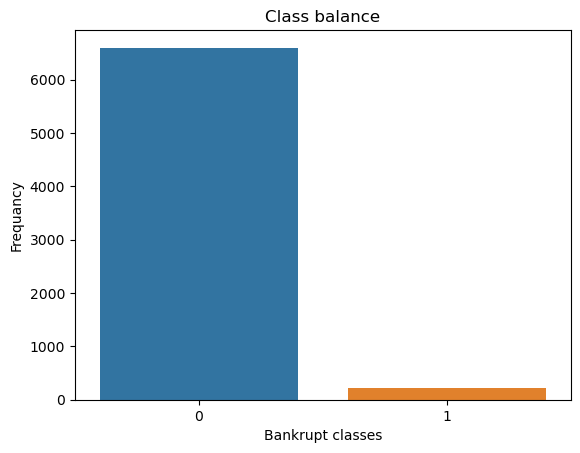

In [17]:
sns.countplot(x=df['Bankrupt'])
plt.xlabel("Bankrupt classes")
plt.ylabel("Frequancy")
plt.title("Class balance")
plt.show()

In [18]:
# By this plot we can clearly say that classes are very strongly imbalanced 

In [19]:
df.columns

Index([' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons',
       ' Cash Flow Per Share', ' Revenue Per Share (Yuan �',
       ' Operating Profit Per Share (Yuan �',
       ' Per Share Net profit before tax (Yuan �',
       ' Realized Sales Gross Profit Growth Rate',
       ' Operating Profit Growth Rate', '

In [20]:
df[df['Bankrupt']==0][' Net Income to Total Assets'].describe()

count    6599.000000
mean        0.810083
std         0.035991
min         0.000000
25%         0.797819
50%         0.811492
75%         0.827158
max         1.000000
Name:  Net Income to Total Assets, dtype: float64

In [21]:
df[df['Bankrupt']==1][' Net Income to Total Assets'].describe()

count    220.000000
mean       0.738083
std        0.081092
min        0.411809
25%        0.719248
50%        0.766297
75%        0.789621
max        0.819091
Name:  Net Income to Total Assets, dtype: float64

# EDA

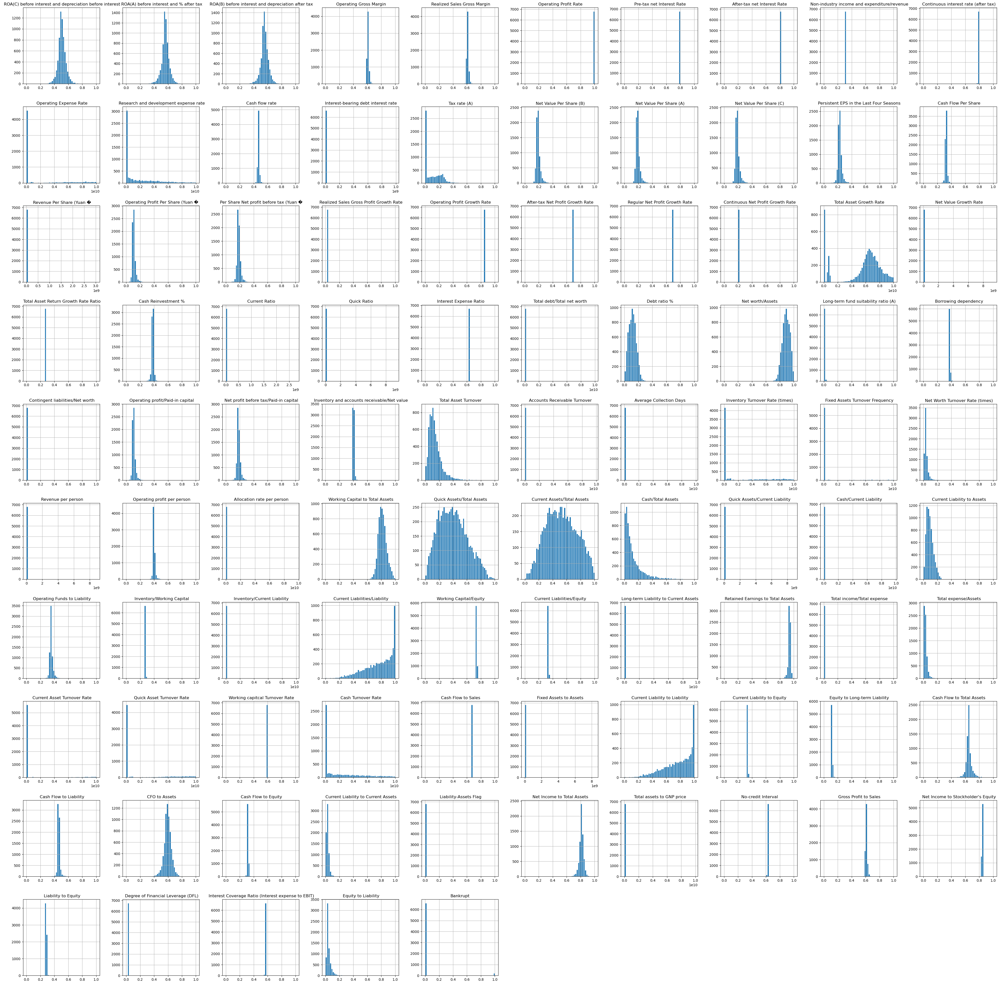

In [22]:
df.hist(figsize=(50,50), bins=50, edgecolor='white')
plt.show()

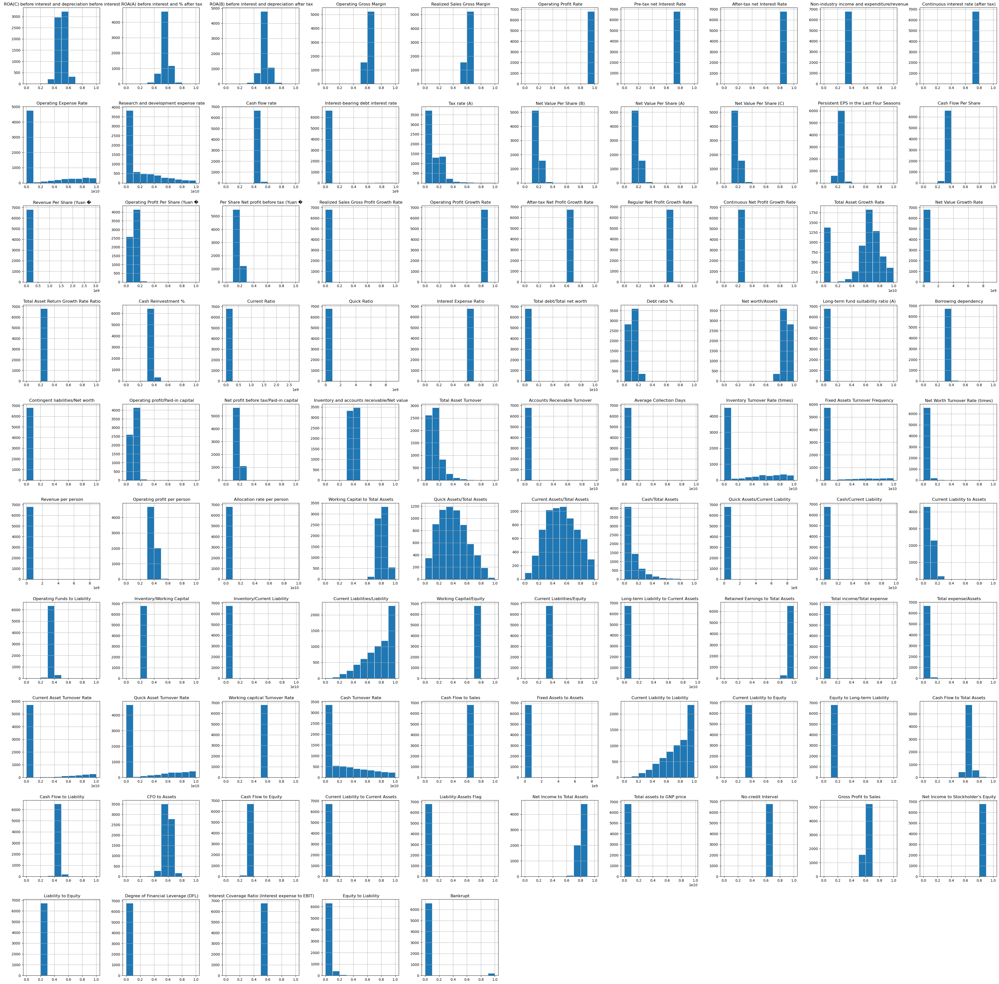

In [23]:
df.hist(figsize=(50,50), edgecolor='white')
plt.show()

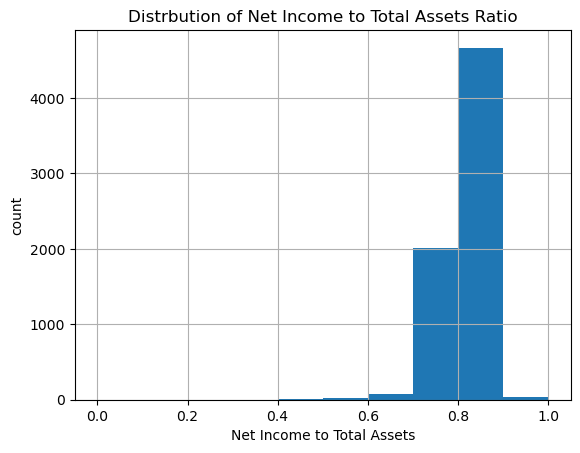

In [24]:
df[' Net Income to Total Assets'].hist()
plt.xlabel("Net Income to Total Assets")
plt.ylabel("count")
plt.title("Distrbution of Net Income to Total Assets Ratio")
plt.show()

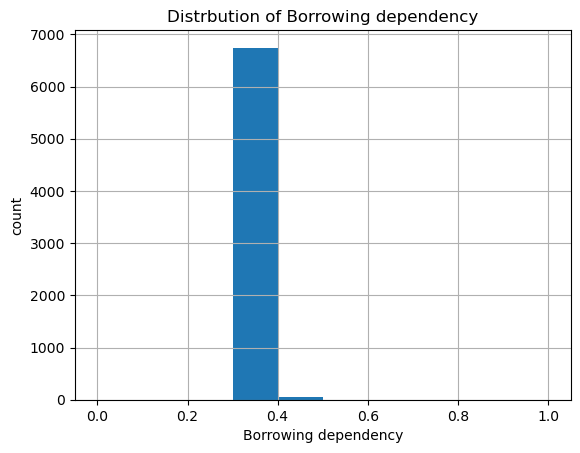

In [25]:
df[' Borrowing dependency'].hist()
plt.xlabel("Borrowing dependency")
plt.ylabel("count")
plt.title("Distrbution of Borrowing dependency")
plt.show()

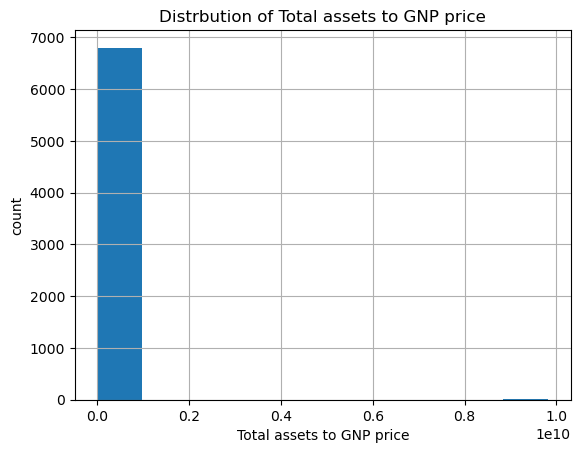

In [26]:
df[' Total assets to GNP price'].hist()
plt.xlabel("Total assets to GNP price")
plt.ylabel("count")
plt.title("Distrbution of Total assets to GNP price")
plt.show()

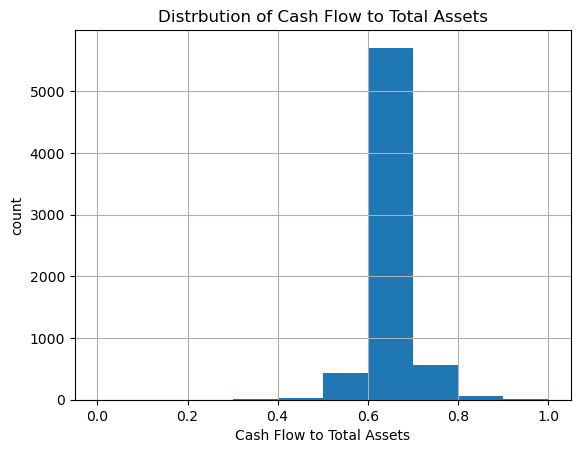

In [27]:
df[' Cash Flow to Total Assets'].hist()
plt.xlabel("Cash Flow to Total Assets")
plt.ylabel("count")
plt.title("Distrbution of Cash Flow to Total Assets")
plt.show()

## Bivariate analysis

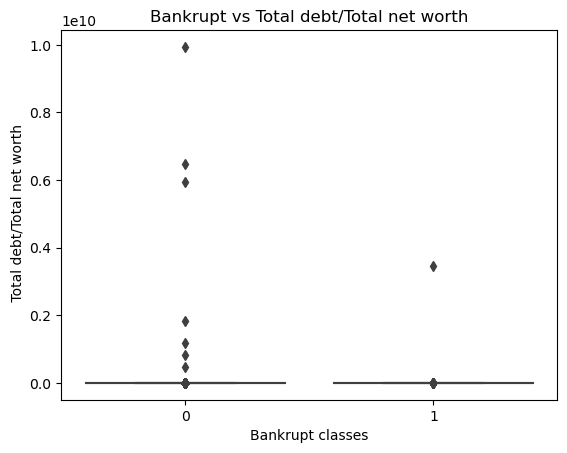

In [28]:
sns.boxplot(df, x='Bankrupt', y=' Total debt/Total net worth')
plt.xlabel("Bankrupt classes")
plt.ylabel(" Total debt/Total net worth")
plt.title("Bankrupt vs Total debt/Total net worth")
plt.show()

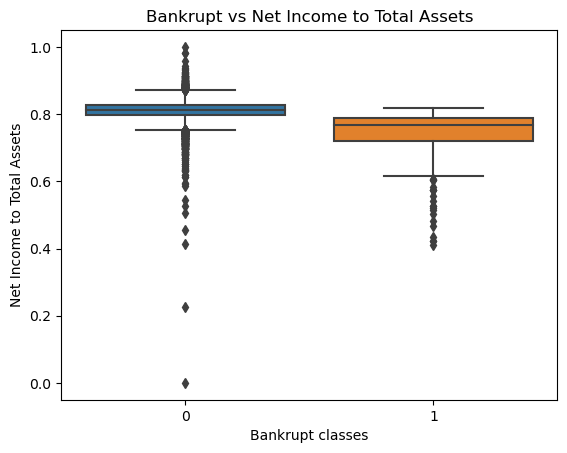

In [29]:
sns.boxplot(df, x= 'Bankrupt', y=' Net Income to Total Assets')
plt.xlabel("Bankrupt classes")
plt.ylabel("Net Income to Total Assets")
plt.title("Bankrupt vs Net Income to Total Assets")
plt.show()

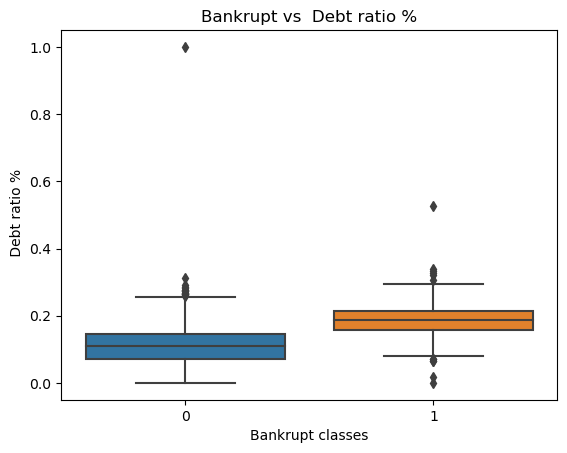

In [30]:
sns.boxplot(df, x= 'Bankrupt', y=' Debt ratio %')
plt.xlabel("Bankrupt classes")
plt.ylabel(" Debt ratio %")
plt.title("Bankrupt vs  Debt ratio %")
plt.show()

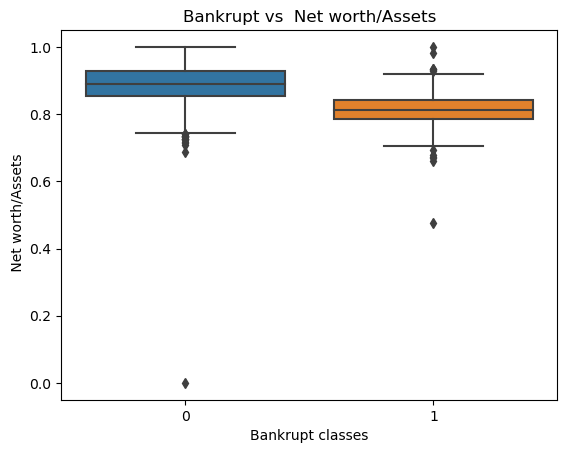

In [31]:
sns.boxplot(df, x= 'Bankrupt', y=' Net worth/Assets')
plt.xlabel("Bankrupt classes")
plt.ylabel(" Net worth/Assets")
plt.title("Bankrupt vs  Net worth/Assets")
plt.show()

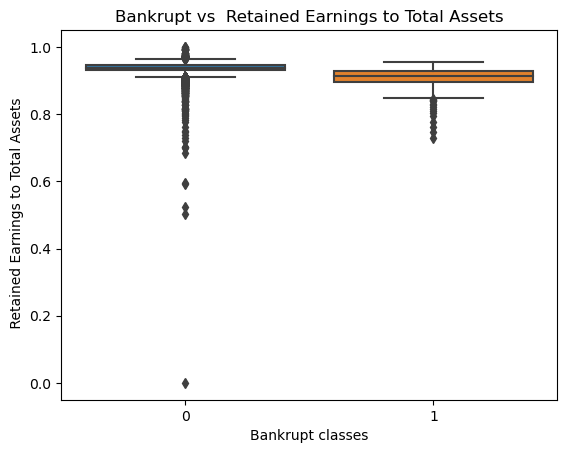

In [32]:
sns.boxplot(df, x= 'Bankrupt', y=' Retained Earnings to Total Assets')
plt.xlabel("Bankrupt classes")
plt.ylabel(" Retained Earnings to Total Assets")
plt.title("Bankrupt vs  Retained Earnings to Total Assets")
plt.show()

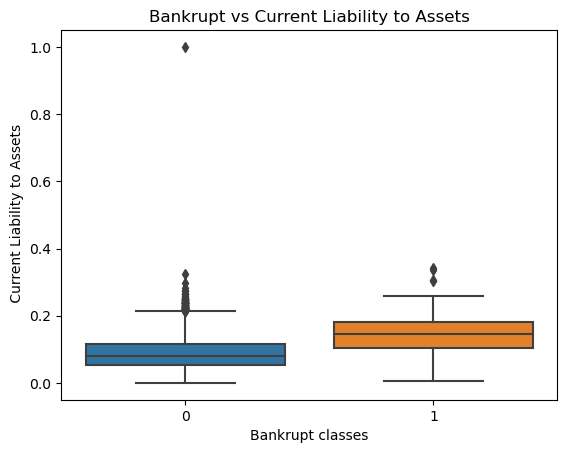

In [33]:
sns.boxplot(df, x= 'Bankrupt', y=' Current Liability to Assets')
plt.xlabel("Bankrupt classes")
plt.ylabel(" Current Liability to Assets")
plt.title("Bankrupt vs Current Liability to Assets")
plt.show()

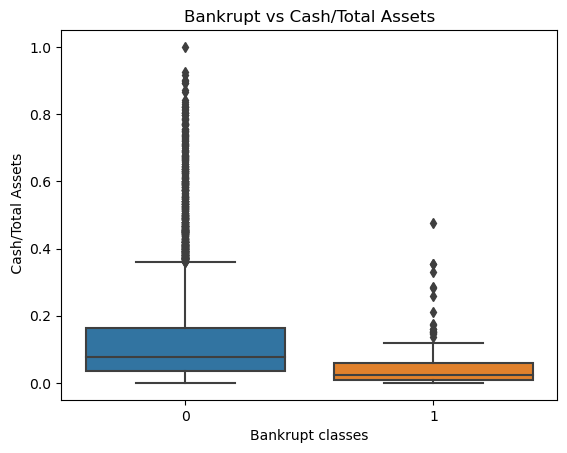

In [34]:
sns.boxplot(df, x= 'Bankrupt', y=' Cash/Total Assets')
plt.xlabel("Bankrupt classes")
plt.ylabel(" Cash/Total Assets")
plt.title("Bankrupt vs Cash/Total Assets")
plt.show()

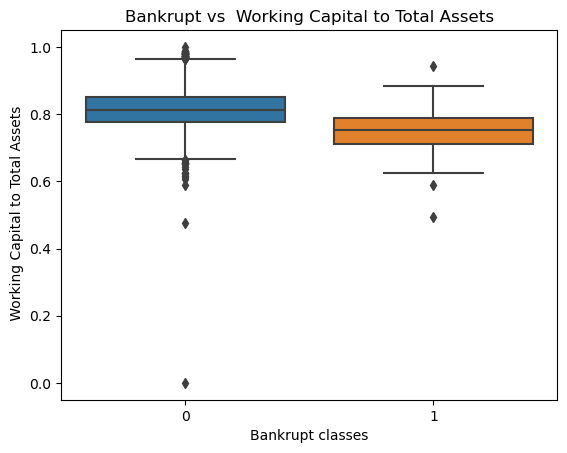

In [35]:
sns.boxplot(df, x= 'Bankrupt', y=' Working Capital to Total Assets')
plt.xlabel("Bankrupt classes")
plt.ylabel(" Working Capital to Total Assets")
plt.title("Bankrupt vs  Working Capital to Total Assets")
plt.show()

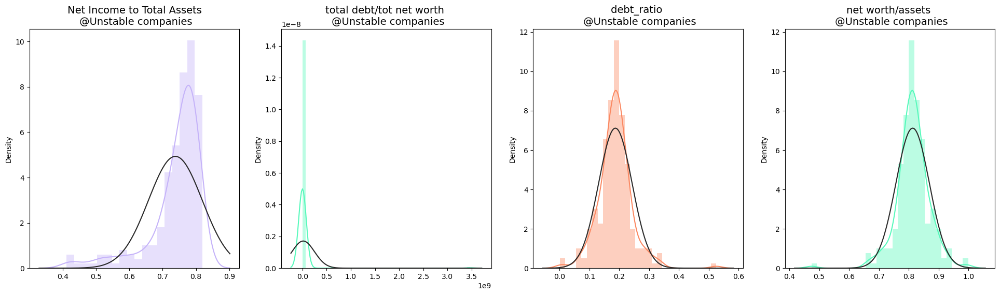

In [36]:
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 6))

cash_inflow_rate = df[' Net Income to Total Assets'].loc[df['Bankrupt'] == 1].values
sns.distplot(cash_inflow_rate,ax=ax1, fit=norm, color='#C5B3F9')
ax1.set_title(' Net Income to Total Assets \n @Unstable companies', fontsize=14)

net_tot_debt = df[' Total debt/Total net worth'].loc[df['Bankrupt'] == 1].values
sns.distplot(net_tot_debt ,ax=ax2, fit=norm, color='#56F9BB')
ax2.set_title('total debt/tot net worth \n @Unstable companies', fontsize=14)


debt_ratio = df[' Debt ratio %'].loc[df['Bankrupt'] == 1].values
sns.distplot(debt_ratio,ax=ax3, fit=norm, color='#FB8861')
ax3.set_title('debt_ratio \n @Unstable companies', fontsize=14)

net_worth_assets = df[' Net worth/Assets'].loc[df['Bankrupt'] == 1].values
sns.distplot(net_worth_assets,ax=ax4, fit=norm, color='#56F9BB')
ax4.set_title('net worth/assets \n @Unstable companies', fontsize=14)

plt.show()

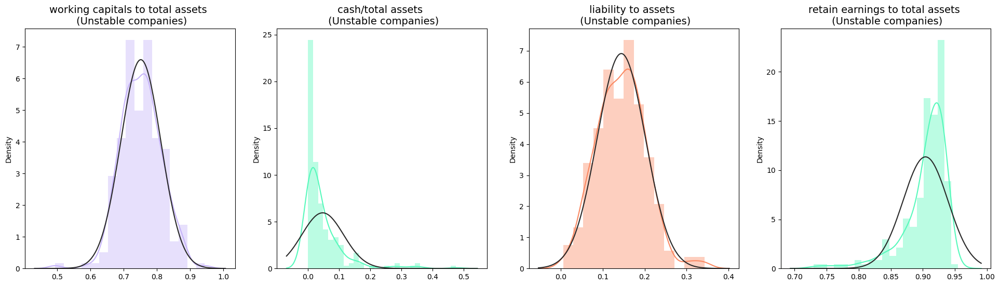

In [37]:
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 6))

work_cap = df[' Working Capital to Total Assets'].loc[df['Bankrupt'] == 1].values
sns.distplot(work_cap,ax=ax1, fit=norm, color='#C5B3F9')
ax1.set_title('working capitals to total assets \n (Unstable companies)', fontsize=14)

cash_to_tot_assets = df[' Cash/Total Assets'].loc[df['Bankrupt'] == 1].values
sns.distplot(cash_to_tot_assets ,ax=ax2, fit=norm, color='#56F9BB')
ax2.set_title('cash/total assets \n (Unstable companies)', fontsize=14)


curr_liab = df[' Current Liability to Assets'].loc[df['Bankrupt'] == 1].values
sns.distplot(curr_liab,ax=ax3, fit=norm, color='#FB8861')
ax3.set_title('liability to assets \n (Unstable companies)', fontsize=14)

ret_ear = df[' Retained Earnings to Total Assets'].loc[df['Bankrupt'] == 1].values
sns.distplot(ret_ear,ax=ax4, fit=norm, color='#56F9BB')
ax4.set_title('retain earnings to total assets \n (Unstable companies)', fontsize=14)

plt.show()

### Heatmap

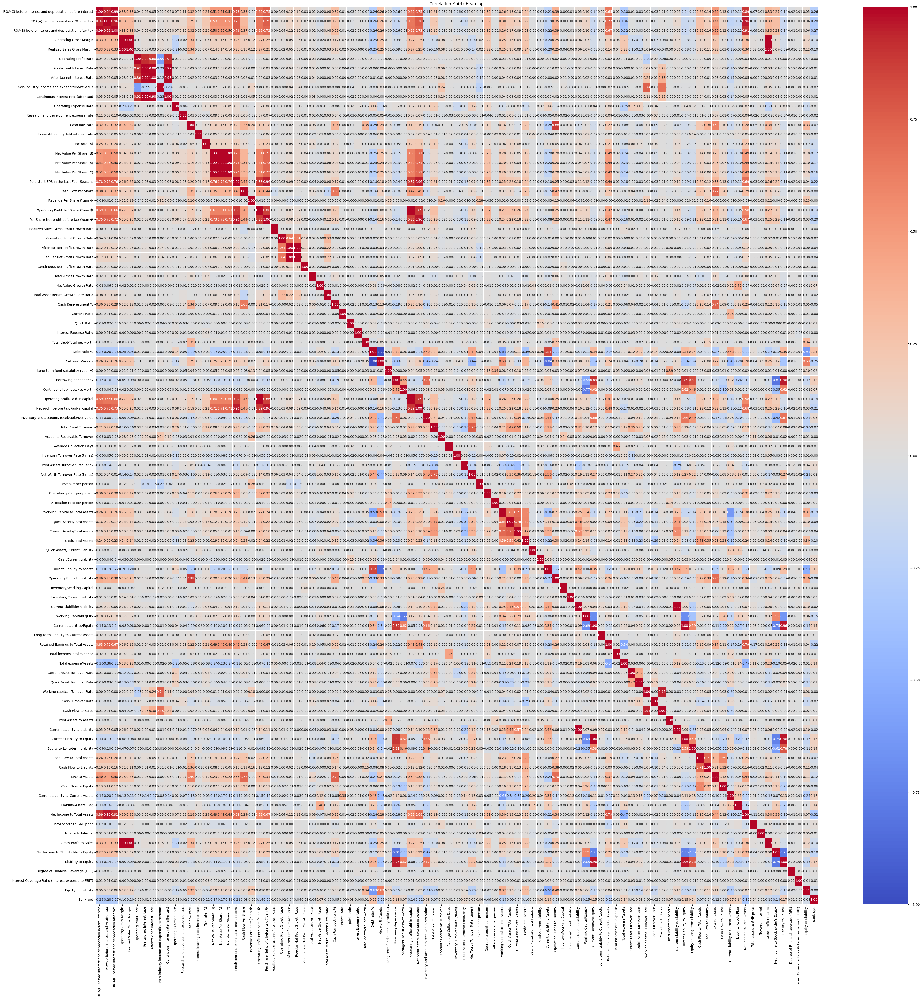

In [38]:
# Calculate the correlation coefficients
correlation_matrix = df.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(50, 50))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

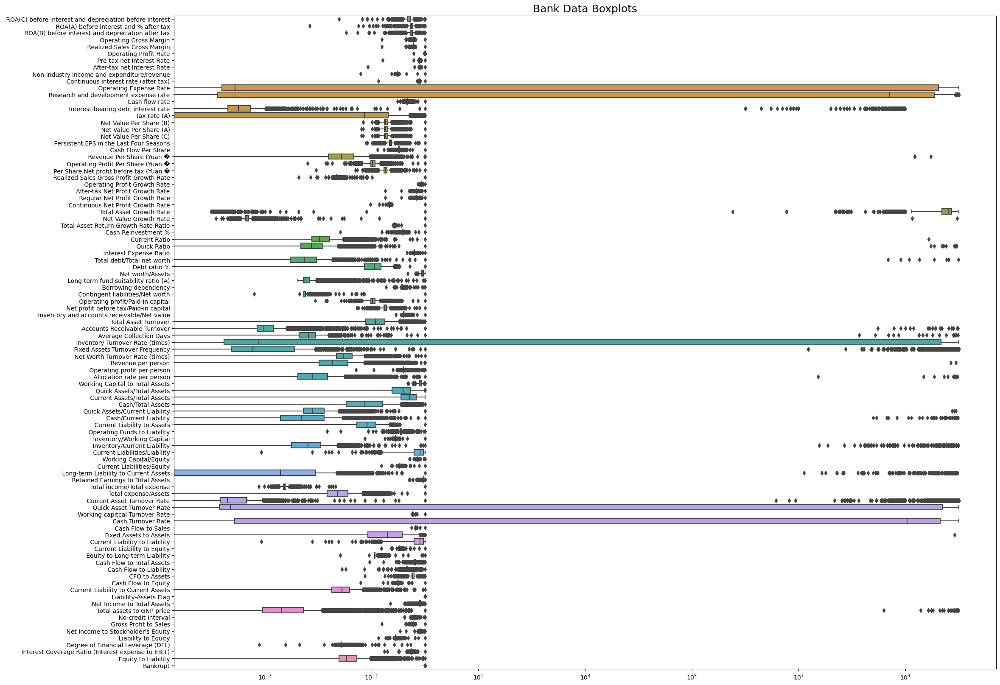

In [39]:
plt.figure(figsize = (25,20))
ax =sns.boxplot(data = df, orient="h")
ax.set_title('Bank Data Boxplots', fontsize = 18)
ax.set(xscale="log")
plt.show()

### Visualizing the Effect of ROA on Bankruptcy using scatterplots

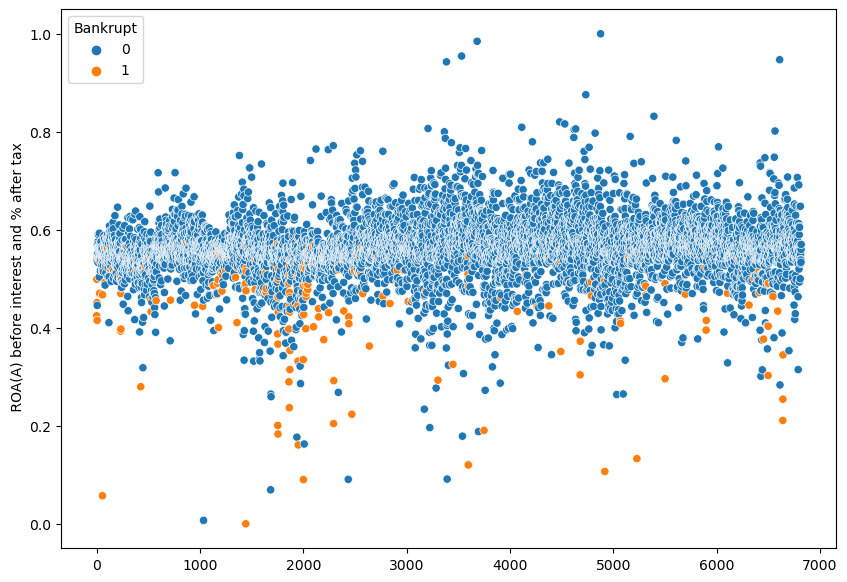

In [40]:
#plotting all the ROA(A) before interest and %after tax samples as scatter plot

fig = plt.figure(figsize = (10,7))
sns.scatterplot(x = df.index ,y = ' ROA(A) before interest and % after tax', hue = 'Bankrupt', data = df)
plt.show()

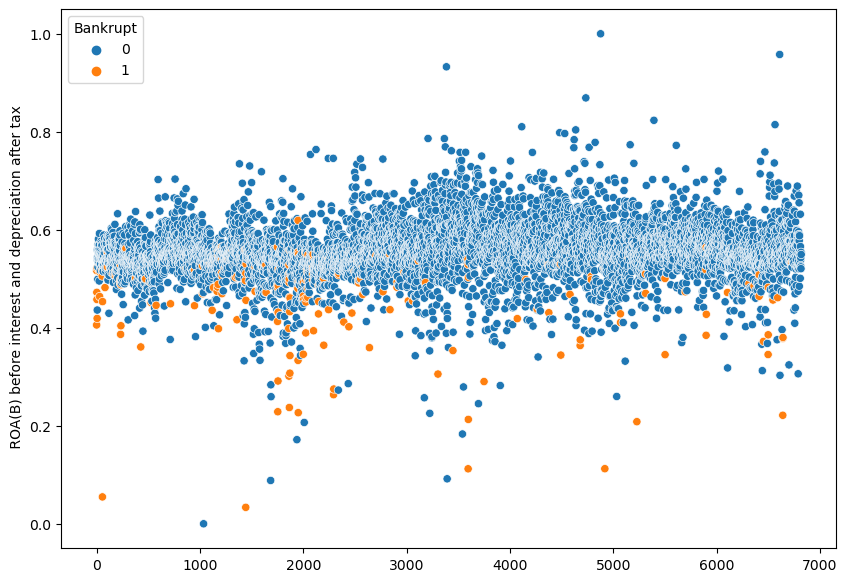

In [41]:
#plotting all the ROA(A) before interest and %after tax samples as scatter plot

fig = plt.figure(figsize = (10,7))
sns.scatterplot(x = df.index ,y = ' ROA(B) before interest and depreciation after tax', hue = 'Bankrupt', data = df)
plt.show()

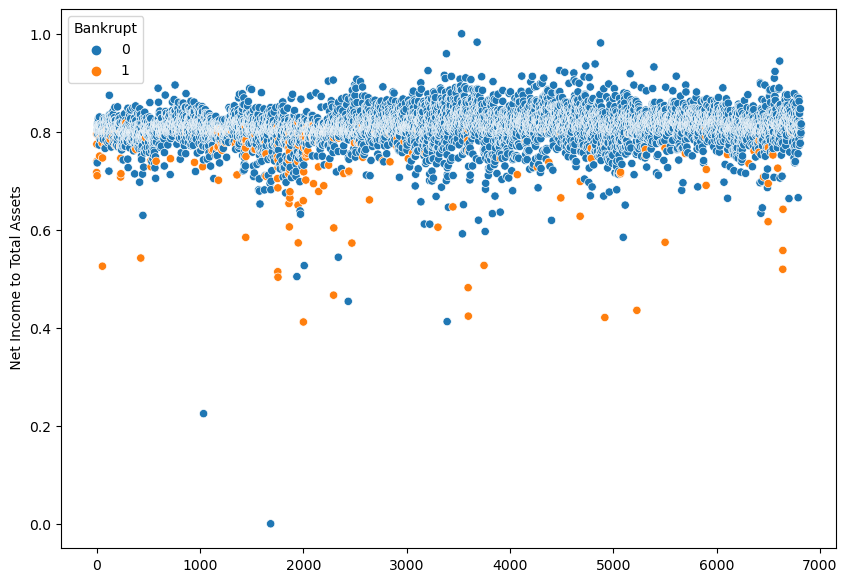

In [42]:
#plotting all the ROA(A) before interest and %after tax samples as scatter plot

fig = plt.figure(figsize = (10,7))
sns.scatterplot(x = df.index ,y = ' Net Income to Total Assets', hue = 'Bankrupt', data = df)
plt.show()

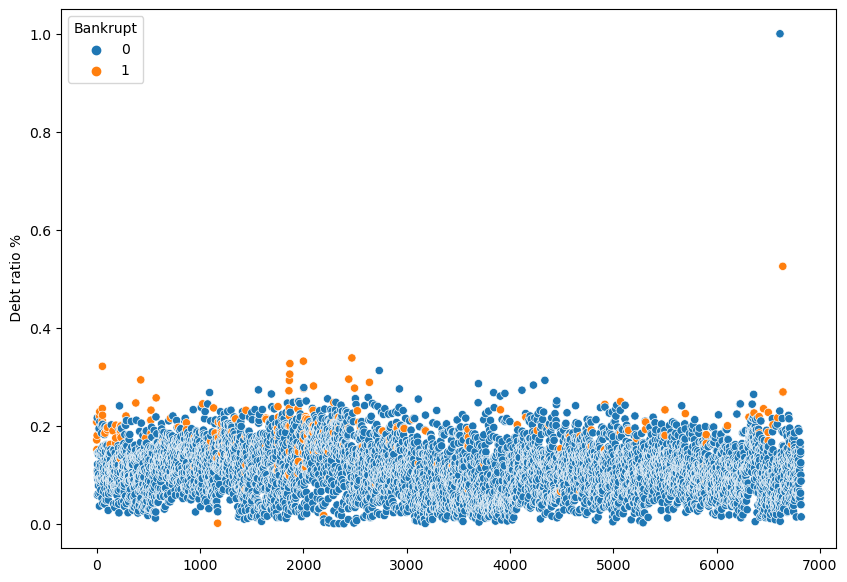

In [43]:
#plotting all the ROA(A) before interest and %after tax samples as scatter plot

fig = plt.figure(figsize = (10,7))
sns.scatterplot(x = df.index ,y = ' Debt ratio %', hue = 'Bankrupt', data = df)
plt.show()

## Modelling

In [44]:
X=df.drop(labels=['Bankrupt'], axis=1)
y=df['Bankrupt']

In [45]:
X

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,...,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,...,0,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,0.020794
2,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,0.780284,...,0,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,0.016474
3,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,0.781241,...,0,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,0.023982
4,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,0.781550,...,0,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,0.035490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,0.781588,...,0,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,0.029890
6815,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,0.781586,...,0,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,0.038284
6816,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,0.781546,...,0,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,0.097649
6817,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,0.781663,...,0,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,0.044009


In [46]:
y.value_counts()

0    6599
1     220
Name: Bankrupt, dtype: int64

### SMOTE

In [47]:
# Oversampling the Target vaiable using SMOTE

oversample = SMOTE()
X,y=oversample.fit_resample(X,y)

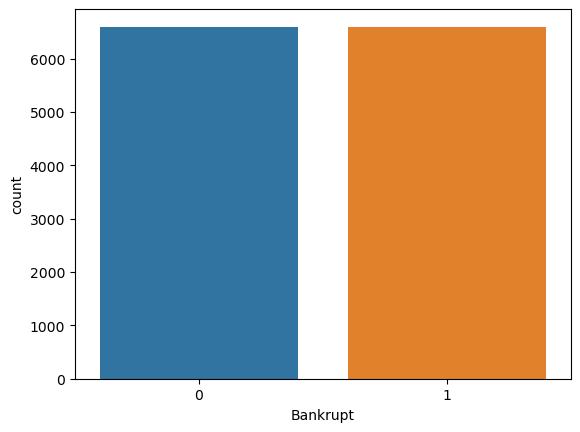

In [48]:
sns.countplot(x=y)
plt.show()

In [49]:
y.value_counts()

1    6599
0    6599
Name: Bankrupt, dtype: int64

# Feature selection

In [50]:
from sklearn.preprocessing import StandardScaler

In [51]:
# Select 30 independent variables out of 96 variables.

In [52]:
from sklearn.feature_selection import SelectFromModel, mutual_info_classif, f_classif, SelectKBest

feature_selection=SelectKBest(f_classif,k=30).fit(X,y)

In [53]:
selected_features=X.columns[feature_selection.get_support()]

In [54]:
selected_features

Index([' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Cash flow rate', ' Tax rate (A)', ' Net Value Per Share (B)',
       ' Net Value Per Share (A)', ' Net Value Per Share (C)',
       ' Persistent EPS in the Last Four Seasons', ' Cash Flow Per Share',
       ' Operating Profit Per Share (Yuan �',
       ' Per Share Net profit before tax (Yuan �', ' Debt ratio %',
       ' Net worth/Assets', ' Operating profit/Paid-in capital',
       ' Net profit before tax/Paid-in capital',
       ' Operating profit per person', ' Working Capital to Total Assets',
       ' Cash/Total Assets', ' Current Liability to Assets',
       ' Operating Funds to Liability', ' Retained Earnings to Total Assets',
       ' Total expense/Assets', ' CFO to Assets',
       ' Current Liability to Current Assets', ' Net In

### Standardize the Independent Variable

In [55]:
scaler=StandardScaler()
X_scale=scaler.fit_transform(X)

In [56]:
# Splitting Train and Test Data

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scale, y,test_size=0.3)

In [57]:
X_train

array([[ 1.59259776,  1.28706849,  1.45673852, ..., -0.08467609,
        -0.01182176,  0.2965821 ],
       [-1.44738755, -1.64726916, -1.32552021, ..., -0.09252738,
        -0.07760019, -0.50864296],
       [ 0.61995321,  0.61099342,  0.56005336, ..., -0.07926109,
         0.0233345 , -0.21368423],
       ...,
       [-0.30373831, -0.15254978, -0.26035783, ..., -0.10812263,
        -0.35824923, -0.40088173],
       [-0.27709062,  0.25141722, -0.24396128, ..., -0.02369552,
         0.2161719 ,  0.50875357],
       [-0.05022993,  0.39668028,  0.04732961, ..., -0.09572596,
        -0.32248183, -0.32820884]])

In [58]:
X_test

array([[-0.99054887, -1.03393752, -0.97034632, ..., -0.09712322,
        -0.12755087, -0.47941481],
       [-0.0269373 ,  0.02258725, -0.0395848 , ..., -0.13183625,
         2.30230135, -0.42560951],
       [ 0.49162258,  0.65526737,  0.52220202, ..., -0.07917111,
         0.02387631, -0.17603611],
       ...,
       [-0.03377065, -0.01362813,  0.05754421, ..., -0.09825451,
        -0.12963965, -0.3525548 ],
       [ 0.1538487 ,  0.37469991,  0.23189235, ..., -0.04362691,
         0.15685466, -0.21696068],
       [-0.53564262, -0.61553068, -0.67308959, ..., -0.09337562,
        -0.08160239, -0.40436071]])

In [59]:
y_train

4554    0
7190    1
367     0
7986    1
7694    1
       ..
5535    0
9819    1
7458    1
421     0
8252    1
Name: Bankrupt, Length: 9238, dtype: int64

In [60]:
y_test

10329    1
10933    1
600      0
797      0
521      0
        ..
8125     1
9060     1
5078     0
6998     1
10052    1
Name: Bankrupt, Length: 3960, dtype: int64

### LOGISTIC REGRESSION

In [61]:
log_reg=LogisticRegression()
log_reg.fit(X_train,y_train)

LogisticRegression()

In [62]:
log_reg.score(X_test,y_test)

0.8964646464646465

In [63]:
y_pred=log_reg.predict(X_test)

In [64]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [65]:
accuracy_score(y_test,y_pred)

0.8964646464646465

In [66]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.90      0.89      0.89      1927
           1       0.90      0.90      0.90      2033

    accuracy                           0.90      3960
   macro avg       0.90      0.90      0.90      3960
weighted avg       0.90      0.90      0.90      3960



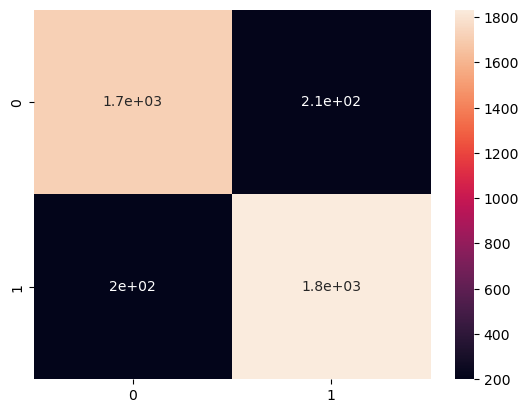

In [67]:
sns.heatmap(confusion_matrix(y_test,y_pred), annot=True)
plt.show()

### Support Vector Machine - Classification

In [68]:
model = SVC()
model.fit(X_train, y_train)

SVC()

In [69]:
model.score(X_test,y_test)

0.9545454545454546

In [70]:
svc_predict=model.predict(X_test)

In [71]:
accuracy_score(y_test,svc_predict)

0.9545454545454546

In [72]:
print(classification_report(y_test, svc_predict))

              precision    recall  f1-score   support

           0       0.98      0.93      0.95      1927
           1       0.93      0.98      0.96      2033

    accuracy                           0.95      3960
   macro avg       0.96      0.95      0.95      3960
weighted avg       0.96      0.95      0.95      3960



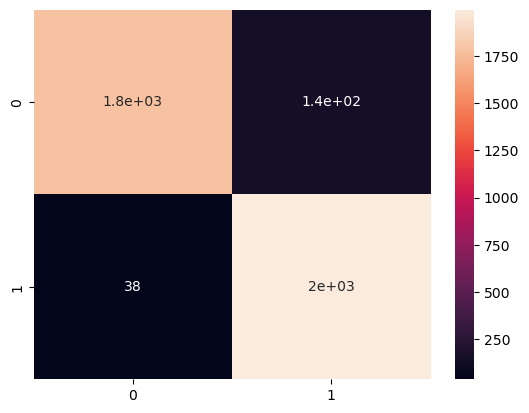

In [73]:
sns.heatmap(confusion_matrix(y_test,svc_predict,), annot=True)
plt.show()

In [74]:
# SVC model predicts the output with 96% accuracy where as Logistic Regression predicts the output with 91% accuracy

In [75]:
original_models = {
    "                   Logistic Regression": LogisticRegression(),
    "                   K-Nearest Neighbors": KNeighborsClassifier(),
    "                         Decision Tree": DecisionTreeClassifier(),
    "Support Vector Machine (Linear Kernel)": LinearSVC(),
    "   Support Vector Machine (RBF Kernel)": SVC(),
    "                         Random Forest": RandomForestClassifier(),
    "                     Gradient Boosting": GradientBoostingClassifier()
}

for name, model in original_models.items():
    model.fit(X_train,y_train)
    print(name + " trained.")

                   Logistic Regression trained.
                   K-Nearest Neighbors trained.
                         Decision Tree trained.
Support Vector Machine (Linear Kernel) trained.
   Support Vector Machine (RBF Kernel) trained.
                         Random Forest trained.
                     Gradient Boosting trained.


In [76]:
original_results = []

for name, model in original_models.items():
    result = model.score(X_train,y_train)
    original_results.append(result)
    print(name + ": {:.2f}%".format(result * 100))

                   Logistic Regression: 90.58%
                   K-Nearest Neighbors: 95.63%
                         Decision Tree: 100.00%
Support Vector Machine (Linear Kernel): 90.83%
   Support Vector Machine (RBF Kernel): 95.68%
                         Random Forest: 100.00%
                     Gradient Boosting: 96.99%


In [77]:
# Tree based algorithms are getting good results

# Dimensionality Reduction (PCA)

In [78]:
data

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469,1
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,0.020794,1
2,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,0.780284,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,0.016474,1
3,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,0.781241,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,0.023982,1
4,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,0.781550,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,0.035490,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,0.781588,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,0.029890,0
6815,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,0.781586,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,0.038284,0
6816,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,0.781546,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,0.097649,0
6817,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,0.781663,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,0.044009,0


In [79]:
data.shape

(6819, 95)

In [80]:
data.describe()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000
mean,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,0.047578,0.032263
std,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,0.012679,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.050014,0.176710
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,0.781567,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,0.024477,0.000000
50%,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,0.781635,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,0.033798,0.000000
75%,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,0.781735,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,0.052838,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [81]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ROA(C) before interest and depreciation before interest,6819.0,0.505180,0.060686,0.0,0.476527,0.502706,0.535563,1.0
ROA(A) before interest and % after tax,6819.0,0.558625,0.065620,0.0,0.535543,0.559802,0.589157,1.0
ROA(B) before interest and depreciation after tax,6819.0,0.553589,0.061595,0.0,0.527277,0.552278,0.584105,1.0
Operating Gross Margin,6819.0,0.607948,0.016934,0.0,0.600445,0.605997,0.613914,1.0
Realized Sales Gross Margin,6819.0,0.607929,0.016916,0.0,0.600434,0.605976,0.613842,1.0
...,...,...,...,...,...,...,...,...
Liability to Equity,6819.0,0.280365,0.014463,0.0,0.276944,0.278778,0.281449,1.0
Degree of Financial Leverage (DFL),6819.0,0.027541,0.015668,0.0,0.026791,0.026808,0.026913,1.0
Interest Coverage Ratio (Interest expense to EBIT),6819.0,0.565358,0.013214,0.0,0.565158,0.565252,0.565725,1.0
Equity to Liability,6819.0,0.047578,0.050014,0.0,0.024477,0.033798,0.052838,1.0


In [82]:
def preprocess_inputs(df):
    df = df.copy()
    
    # Split df into X and y
    y = df['Bankrupt']
    X = df.drop('Bankrupt', axis=1)
    
    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, shuffle=True, random_state=1)
    
    # Scale X
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train = pd.DataFrame(scaler.transform(X_train), index=X_train.index, columns=X_train.columns)
    X_test = pd.DataFrame(scaler.transform(X_test), index=X_test.index, columns=X_test.columns)
    
    return X_train, X_test, y_train, y_test

In [83]:
X_train, X_test, y_train, y_test = preprocess_inputs(data)

In [84]:
X_train

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
3392,-7.065972,-7.189713,-7.577832,-0.353178,-0.352216,-27.422519,-9.852867,-9.473508,0.174600,-17.488804,...,-0.032383,-9.998552,4.692638,-0.014135,-0.353225,-1.832779,-0.140534,-0.046856,-0.002980,-0.193823
2755,0.405365,0.354931,0.313557,0.203699,0.200630,0.105921,0.077435,0.062927,0.047214,0.099756,...,-0.032383,0.400919,-0.053114,-0.022182,0.203712,0.096787,-0.171572,-0.042981,0.019996,-0.101423
4442,1.063045,1.174855,1.177379,1.634667,1.635325,0.255679,0.096169,0.093795,0.003669,0.157860,...,-0.032383,1.167791,-0.053114,-0.015673,1.634904,0.195891,-0.260642,-0.046222,0.000988,0.460305
4267,-0.503014,-0.324003,-0.454382,-0.296140,-0.283111,-0.186523,0.016814,0.015052,0.103257,0.012236,...,-0.032383,-0.263996,-0.053114,-0.056605,-0.296136,-0.020661,-0.118012,0.026918,0.200834,-0.246507
4912,-0.145685,-0.062164,-0.098122,-0.707418,-0.706759,0.011218,0.016078,0.022094,0.014597,0.026255,...,-0.032383,-0.051356,-0.053114,0.054243,-0.707358,0.030413,0.028918,-0.031311,0.074381,-0.443493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
905,-0.121267,-0.052933,-0.160577,0.396829,0.383409,0.062863,0.032879,0.031040,0.012131,0.041490,...,-0.032383,0.058626,-0.053114,-0.019407,0.396914,0.038720,-0.145246,-0.044050,0.013951,-0.181453
5192,0.353272,0.448925,0.380411,-0.302144,-0.300137,0.053898,0.025100,0.027851,0.006583,0.035737,...,-0.032383,0.397778,-0.053114,-0.008254,-0.301900,0.157339,0.139915,-0.045442,0.005757,-0.516740
3980,0.306876,0.274365,0.367216,0.887161,0.889183,0.157314,0.047838,0.052563,-0.011575,0.080793,...,-0.032383,0.345919,-0.053114,0.011347,0.887037,0.072415,-0.252116,-0.046724,-0.002147,0.369173
235,-2.245702,-2.479975,-2.445042,-0.393706,-0.392779,-0.223142,-0.136463,-0.126225,-0.067058,-0.233955,...,-0.032383,-2.361698,-0.053114,-0.031286,-0.393747,-0.800755,0.524917,-0.051040,-0.031559,-0.629681


In [85]:
X_train

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
3392,-7.065972,-7.189713,-7.577832,-0.353178,-0.352216,-27.422519,-9.852867,-9.473508,0.174600,-17.488804,...,-0.032383,-9.998552,4.692638,-0.014135,-0.353225,-1.832779,-0.140534,-0.046856,-0.002980,-0.193823
2755,0.405365,0.354931,0.313557,0.203699,0.200630,0.105921,0.077435,0.062927,0.047214,0.099756,...,-0.032383,0.400919,-0.053114,-0.022182,0.203712,0.096787,-0.171572,-0.042981,0.019996,-0.101423
4442,1.063045,1.174855,1.177379,1.634667,1.635325,0.255679,0.096169,0.093795,0.003669,0.157860,...,-0.032383,1.167791,-0.053114,-0.015673,1.634904,0.195891,-0.260642,-0.046222,0.000988,0.460305
4267,-0.503014,-0.324003,-0.454382,-0.296140,-0.283111,-0.186523,0.016814,0.015052,0.103257,0.012236,...,-0.032383,-0.263996,-0.053114,-0.056605,-0.296136,-0.020661,-0.118012,0.026918,0.200834,-0.246507
4912,-0.145685,-0.062164,-0.098122,-0.707418,-0.706759,0.011218,0.016078,0.022094,0.014597,0.026255,...,-0.032383,-0.051356,-0.053114,0.054243,-0.707358,0.030413,0.028918,-0.031311,0.074381,-0.443493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
905,-0.121267,-0.052933,-0.160577,0.396829,0.383409,0.062863,0.032879,0.031040,0.012131,0.041490,...,-0.032383,0.058626,-0.053114,-0.019407,0.396914,0.038720,-0.145246,-0.044050,0.013951,-0.181453
5192,0.353272,0.448925,0.380411,-0.302144,-0.300137,0.053898,0.025100,0.027851,0.006583,0.035737,...,-0.032383,0.397778,-0.053114,-0.008254,-0.301900,0.157339,0.139915,-0.045442,0.005757,-0.516740
3980,0.306876,0.274365,0.367216,0.887161,0.889183,0.157314,0.047838,0.052563,-0.011575,0.080793,...,-0.032383,0.345919,-0.053114,0.011347,0.887037,0.072415,-0.252116,-0.046724,-0.002147,0.369173
235,-2.245702,-2.479975,-2.445042,-0.393706,-0.392779,-0.223142,-0.136463,-0.126225,-0.067058,-0.233955,...,-0.032383,-2.361698,-0.053114,-0.031286,-0.393747,-0.800755,0.524917,-0.051040,-0.031559,-0.629681


In [86]:
X_test

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
313,-0.446850,-0.234206,-0.361139,-0.449243,-0.459881,0.014501,0.017643,0.022714,0.015045,0.018557,...,-0.032383,-0.131258,-0.053114,0.037181,-0.449238,0.001034,-0.201222,-0.039198,0.039768,0.018960
6724,-0.548595,-0.324842,-0.441187,-0.751448,-0.750826,-0.000021,0.004294,0.011376,0.005238,0.005834,...,-0.032383,-0.236294,-0.053114,-0.027865,-0.751642,-0.013888,-0.031466,0.033069,0.207916,-0.383355
4494,-0.813132,-0.847680,-0.650545,-0.099507,-0.087812,-0.081592,-0.090157,-0.066393,-0.073559,-0.105836,...,-0.032383,-0.740061,-0.053114,-0.011223,-0.099314,-0.130431,0.025792,-0.056844,-0.079611,-0.440833
5422,-0.225453,-0.241759,-0.156179,-0.371691,-0.370745,0.048847,0.019806,0.022315,0.002436,0.023338,...,-0.032383,-0.150154,-0.053114,0.098072,-0.371599,0.005178,-0.022403,-0.042652,0.021810,-0.393722
2754,0.037456,-0.122589,0.032067,-0.380697,-0.388772,0.055791,0.015157,0.016336,-0.006307,0.014910,...,-0.032383,-0.100464,-0.053114,-0.027243,-0.380601,0.011897,-0.098478,-0.023777,0.101082,-0.285073
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4992,0.581995,0.559702,0.586250,0.267242,0.274242,0.162996,0.073753,0.071297,0.017455,0.114829,...,-0.032383,0.488364,-0.053114,0.033607,0.267475,0.091855,-0.263713,-0.046424,-0.000267,0.496781
1331,-0.474525,-0.284559,-0.447345,-0.758953,-0.758338,0.006419,0.007332,0.012528,0.006079,0.007698,...,-0.032383,-0.214466,-0.053114,-0.032456,-0.759137,-0.003470,0.217583,-0.007293,0.144994,-0.551481
6372,-0.398013,-0.184691,-0.369056,-0.858020,-0.857490,0.006167,0.007378,0.012838,0.006303,0.008751,...,-0.032383,-0.138527,-0.053114,-0.079320,-0.858184,0.025145,0.370554,-0.021438,0.108383,-0.598539
6715,0.274318,0.323041,0.205359,-0.427228,-0.424327,0.083066,0.037344,0.035956,0.008601,0.047973,...,-0.032383,0.440434,-0.053114,0.014332,-0.427227,0.097871,-0.200016,-0.046856,-0.002980,0.013235


In [87]:
y_train

3392    0
2755    0
4442    0
4267    0
4912    0
       ..
905     0
5192    0
3980    0
235     1
5157    0
Name: Bankrupt, Length: 4773, dtype: int64

## Training (Original Data)

In [88]:
original_models = {
    "                   Logistic Regression": LogisticRegression(),
    "                   K-Nearest Neighbors": KNeighborsClassifier(),
    "                         Decision Tree": DecisionTreeClassifier(),
    "Support Vector Machine (Linear Kernel)": LinearSVC(),
    "   Support Vector Machine (RBF Kernel)": SVC(),
    "                         Random Forest": RandomForestClassifier(),
    "                     Gradient Boosting": GradientBoostingClassifier()
}

for name, model in original_models.items():
    model.fit(X_train, y_train)
    print(name + " trained.")

                   Logistic Regression trained.
                   K-Nearest Neighbors trained.
                         Decision Tree trained.
Support Vector Machine (Linear Kernel) trained.
   Support Vector Machine (RBF Kernel) trained.
                         Random Forest trained.
                     Gradient Boosting trained.


In [89]:
original_results = []

for name, model in original_models.items():
    result = model.score(X_test, y_test)
    original_results.append(result)
    print(name + ": {:.2f}%".format(result * 100))

                   Logistic Regression: 96.43%
                   K-Nearest Neighbors: 96.48%
                         Decision Tree: 95.26%
Support Vector Machine (Linear Kernel): 96.29%
   Support Vector Machine (RBF Kernel): 96.58%
                         Random Forest: 96.53%
                     Gradient Boosting: 96.19%


In [90]:
data.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469,1
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,0.020794,1
2,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,0.780284,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,0.016474,1
3,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,0.781241,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,0.023982,1
4,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,0.781550,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,0.035490,1


# PCA Visualization

In [91]:
from sklearn.decomposition import PCA

In [92]:
n_components = 10

pca = PCA(n_components=n_components)
pca.fit(X_train)

X_train_reduced = pd.DataFrame(pca.transform(X_train), index=X_train.index, columns=["PC" + str(i) for i in
                                                                                     range(1, n_components + 1)])
X_test_reduced = pd.DataFrame(pca.transform(X_test), index=X_test.index, columns=["PC" + str(i) for i in
                                                                                  range(1, n_components + 1)])

In [93]:
X_train_reduced

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
3392,21.396950,-7.427372,-10.384925,16.381415,8.403207,14.812320,-1.097369,0.058848,2.193352,-3.061531
2755,-0.537248,-0.632460,1.522409,0.059739,-0.893489,0.114783,0.161922,-0.373149,-0.611017,-0.380469
4442,-3.777730,-0.482826,1.127474,0.334639,1.276812,0.356458,0.874732,-0.563435,-1.605754,-1.027774
4267,3.117705,-0.669590,1.192659,-0.645653,-1.863517,0.653932,0.849205,-0.813650,-0.451901,-0.815060
4912,0.849585,0.693120,-1.479504,-0.478610,-0.759129,0.080789,-0.790635,0.858998,0.974397,0.540498
...,...,...,...,...,...,...,...,...,...,...
905,0.566137,-0.528473,0.117817,-0.414917,0.398289,0.994318,-0.126714,-0.608482,-0.970425,-0.193712
5192,-2.253180,3.499003,-4.647426,-0.692825,-0.645467,1.185645,-0.209950,0.497660,0.606704,0.447495
3980,-5.630043,0.346127,-0.506350,1.037783,2.011157,0.593498,-1.479293,-2.755381,0.550915,0.483074
235,7.567253,-0.172400,0.268317,-0.820259,-0.232738,-0.911629,2.116155,-0.003195,-0.392218,0.133987


In [94]:
fig = px.bar(
    x=["PC" + str(i) for i in range(1, n_components + 1)],
    y=pca.explained_variance_ratio_,
    labels={'x': "Principal Component", 'y': "Variance Ratio"},
    color=pca.explained_variance_ratio_,
    color_continuous_scale=[(0, 'lightblue'), (1, 'darkblue')],
    title="Proportion of Variance in Principal Components"
)

fig.show()

In [95]:
reduced_models = {
    "                   Logistic Regression": LogisticRegression(),
    "                   K-Nearest Neighbors": KNeighborsClassifier(),
    "                         Decision Tree": DecisionTreeClassifier(),
    "Support Vector Machine (Linear Kernel)": LinearSVC(),
    "   Support Vector Machine (RBF Kernel)": SVC(),
    "                         Random Forest": RandomForestClassifier(),
    "                     Gradient Boosting": GradientBoostingClassifier()
}

for name, model in reduced_models.items():
    model.fit(X_train_reduced, y_train)
    print(name + " trained.")

                   Logistic Regression trained.
                   K-Nearest Neighbors trained.
                         Decision Tree trained.
Support Vector Machine (Linear Kernel) trained.
   Support Vector Machine (RBF Kernel) trained.
                         Random Forest trained.
                     Gradient Boosting trained.


In [96]:
reduced_results = []

for name, model in reduced_models.items():
    result = model.score(X_test_reduced, y_test)
    reduced_results.append(result)
    print(name + ": {:.2f}%".format(result * 100))

                   Logistic Regression: 96.19%
                   K-Nearest Neighbors: 96.29%
                         Decision Tree: 94.82%
Support Vector Machine (Linear Kernel): 96.33%
   Support Vector Machine (RBF Kernel): 96.63%
                         Random Forest: 96.48%
                     Gradient Boosting: 96.29%


In [97]:
fig = px.bar(
    x=np.subtract(reduced_results, original_results),
    y=original_models.keys(),
    orientation='h',
    labels={'x': "Change in Performance", 'y': "Model"},
    color=np.subtract(reduced_results, original_results),
    color_continuous_scale=[(0, 'red'), (1, 'blue')],
    title="Change in Model Performance After Dimensionality Reduction"
)

fig.show()


In [98]:
clf = RandomForestClassifier(random_state=42)

In [99]:
params= {
    
    "n_estimators":range(25 , 100 , 25),
    "max_depth": range(10 , 70 , 10)
    
}
params

{'n_estimators': range(25, 100, 25), 'max_depth': range(10, 70, 10)}

In [100]:
from sklearn.model_selection import train_test_split , GridSearchCV

In [101]:
model = GridSearchCV(

    clf,
    param_grid= params,
    cv=5,
    n_jobs=-1,
    verbose= 1

)
model

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': range(10, 70, 10),
                         'n_estimators': range(25, 100, 25)},
             verbose=1)

In [102]:
model.fit(X_train , y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': range(10, 70, 10),
                         'n_estimators': range(25, 100, 25)},
             verbose=1)

In [103]:
model.best_params_

{'max_depth': 10, 'n_estimators': 50}

In [104]:
model.predict(X_train)

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

In [105]:
features = X_test.columns
importances = model.best_estimator_.feature_importances_

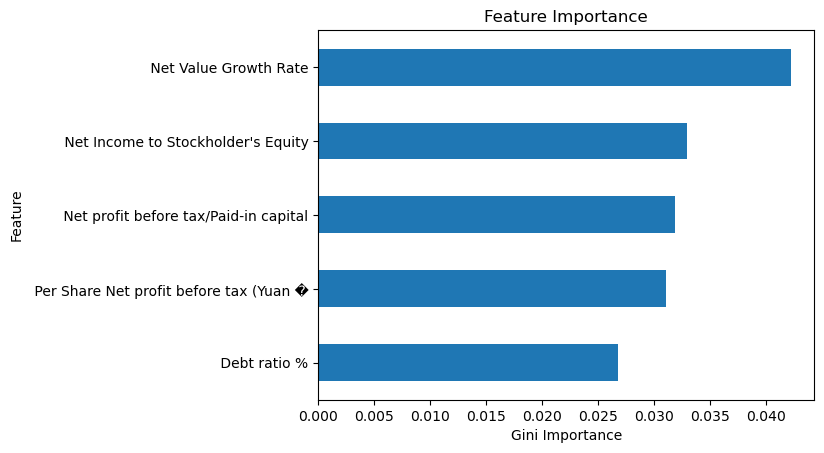

In [106]:
feat_imp = pd.Series(importances , index=features).sort_values()
feat_imp.tail().plot(kind= 'barh')
plt.xlabel("Gini Importance")
plt.ylabel("Feature")
plt.title("Feature Importance")
plt.show()

In [107]:
# !pip uninstall scikit-learn --yes
# !pip uninstall imblearn --yes
# !pip install scikit-learn==1.2.2
# !pip install imblearn
# !pip install mlxtend 